<img src="./assets/chicago_thin.gif" style="float:center ; margin: 0px ; width:1000px;"> 

# Predicting West Nile Virus cases with Data Science

---



# 2. Exploratory Data Analysis

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
%matplotlib inline


import geopandas as gpd
from geopandas import GeoSeries, GeoDataFrame
from geopy.distance import geodesic

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)
import matplotlib.patches as patches
import matplotlib.patches as mpatches
import matplotlib.transforms as transforms

import datetime as dt

import shapely
from shapely import geometry
from shapely import ops
from shapely.geometry import Point, LineString, Polygon, MultiPoint, shape,mapping
from shapely.ops import nearest_points
from shapely.geometry import Point

from sklearn.impute import SimpleImputer
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import silhouette_score
from sklearn.neighbors import KNeighborsClassifier

from haversine import haversine, Unit

#Uncomment to download Geopandas & haversine
#!pip3 install --upgrade --target=/Users/samuelhe/opt/anaconda3/lib/python3.7/site-packages geopandas
#!pip3 install --upgrade --target=/Users/samuelhe/opt/anaconda3/lib/python3.7/site-packages haversine

/Users/user/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## 2.1 What makes WNV thrive?
As our first step in the EDA process, we will be looking at some of our columns and whether there is a clear relationship between certain conditions and the presence of WNV during checks

In [2]:
#To start the EDA process, we will read in our cleaned CSV files:
test=pd.read_csv('data/test.csv',parse_dates=['Date'])
train=pd.read_csv('data/train.csv',parse_dates=['Date'])
spray_cleaned=pd.read_csv('data/spray_cleaned.csv',parse_dates=['Date'])
weather_cleaned=pd.read_csv('data/weather_cleaned.csv',parse_dates=['Date'])


In [3]:
train.head(1)

,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent
0,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9,1,0


In [4]:
train.columns

Index(['Date', 'Address', 'Species', 'Block', 'Street', 'Trap',
       'AddressNumberAndStreet', 'Latitude', 'Longitude', 'AddressAccuracy',
       'NumMosquitos', 'WnvPresent'],
      dtype='object')

In [5]:
len(train["Street"].unique())

128

In [6]:
train.describe()
# As we can see from the "WnvPresent" column,a mean of 0.05 means that only...
# ...5% of our data tested positive for WNV.
# i.e. A base model prediction of all entries being WNV-negative will get a 95% accuracy score
# i.e. We are working with an imbalanced dataset.

,Block,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent
count,10506.000000,10506.000000,10506.000000,10506.000000,10506.000000,10506.000000
mean,35.687797,41.841139,-87.699908,7.819532,12.853512,0.052446
std,24.339468,0.112742,0.096514,1.452921,16.133816,0.222936
min,10.000000,41.644612,-87.930995,3.000000,1.000000,0.000000
25%,12.000000,41.732984,-87.760070,8.000000,2.000000,0.000000
50%,33.000000,41.846283,-87.694991,8.000000,5.000000,0.000000
75%,52.000000,41.954690,-87.627796,9.000000,17.000000,0.000000
max,98.000000,42.017430,-87.531635,9.000000,50.000000,1.000000


In [7]:
# Looking at Counts of mosquitos by Species
# As we can see Culex Pipiens and Restuans are our main culprits
train.groupby(['Species'])['NumMosquitos','WnvPresent'].sum()

/Users/user/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  This is separate from the ipykernel package so we can avoid doing imports until


,NumMosquitos,WnvPresent
Species,,
CULEX ERRATICUS,7,0
CULEX PIPIENS,44671,240
CULEX PIPIENS/RESTUANS,66268,262
CULEX RESTUANS,23431,49
CULEX SALINARIUS,145,0
CULEX TARSALIS,7,0
CULEX TERRITANS,510,0


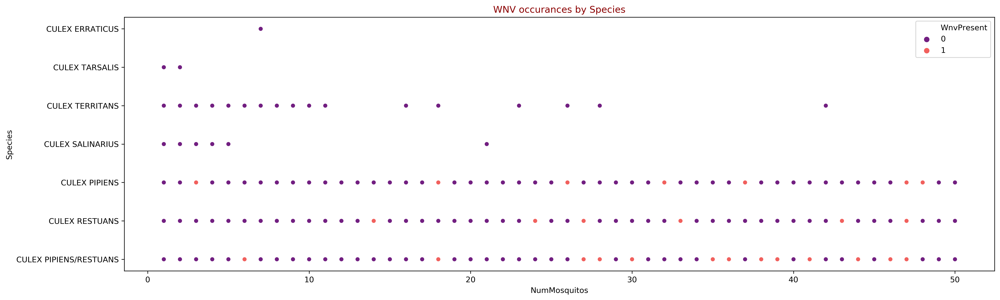

In [8]:
#Creating a plot to look at the WNV occurances by Species
#We can tell that as the number of Pipiens/Restuans found in a sample goes up, the chance of WNV goes up
plt.figure(figsize=(20,6), dpi=300);
sns.scatterplot("NumMosquitos", "Species", data=train, hue="WnvPresent", palette="magma");
plt.title('WNV occurances by Species', fontsize=12, c="darkred");


# Comment: can consider changing the size of the dot for different outcomes (i.e. maybe target = 1 plotsize can be slightly bigger than target = 0)

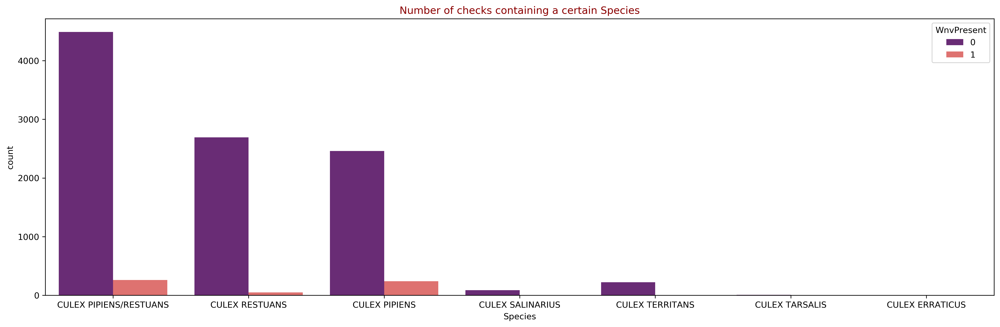

In [9]:
#Creating an alternate plot to look at the WNV occurances by Species
plt.figure(figsize=(20,6), dpi=300);
sns.countplot("Species", data=train, hue="WnvPresent", palette="magma");
plt.title('Number of checks containing a certain Species', fontsize=12, c="darkred");

In [10]:
# Looking at means of mosquitos by Species
# As we can see Culex Pipiens are the most deadly...
# When there is Culex Pipiens found in a sample, there is a 8.8% chance that there will be WNV found
train.groupby(['Species'])['NumMosquitos','WnvPresent'].mean()

/Users/user/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  after removing the cwd from sys.path.


,NumMosquitos,WnvPresent
Species,,
CULEX ERRATICUS,7.000000,0.000000
CULEX PIPIENS,16.550945,0.088922
CULEX PIPIENS/RESTUANS,13.945286,0.055135
CULEX RESTUANS,8.551460,0.017883
CULEX SALINARIUS,1.686047,0.000000
CULEX TARSALIS,1.166667,0.000000
CULEX TERRITANS,2.297297,0.000000


In [11]:
# Creating a dataframe to plot observations by month
train_eda_years = train
train_eda_years["Year"] = [entry.year for entry in train["Date"]]
train_eda_years["Month"] = [entry.month for entry in train["Date"]]

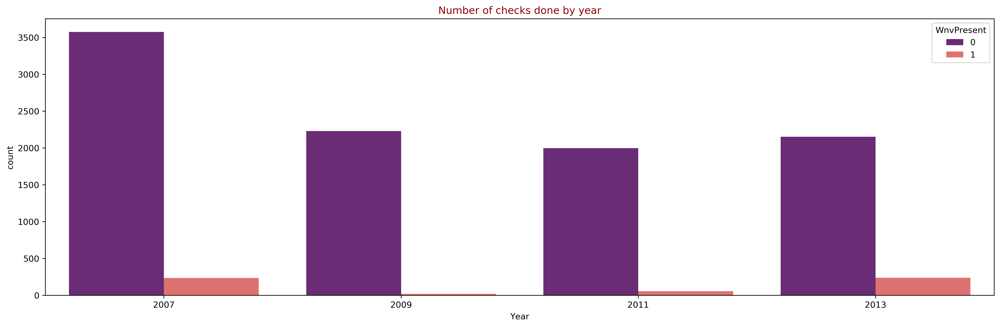

In [12]:
#Creating an alternate plot to look at the number of checks by year,
plt.figure(figsize=(20,6), dpi=300);
sns.countplot("Year", data=train_eda_years, hue="WnvPresent", palette="magma");
plt.title('Number of checks done by year', fontsize=12, c="darkred");

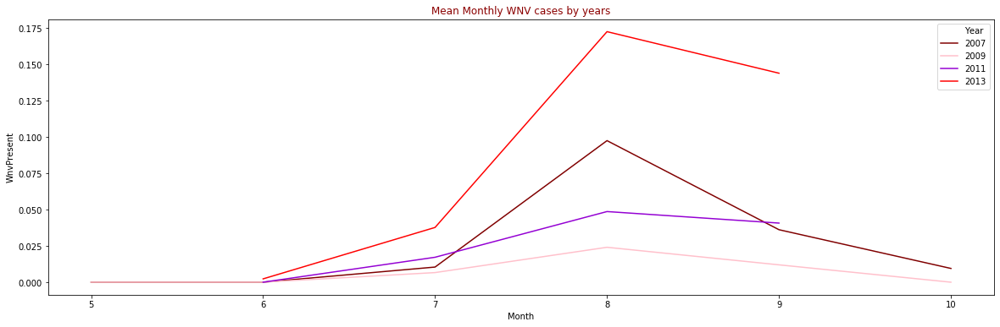

In [13]:
# Creating a line plot to observe the data by months
color_dict = dict({2007:'maroon',
                  2009:'pink',
                  2011: 'darkviolet',
                  2013: 'red'})
plt.figure(figsize=(20,6));
sns.lineplot(x = "Month",y = 'WnvPresent', data = train_eda_years, hue = 'Year', ci = None, 
             legend = 'full', palette = color_dict);
plt.title('Mean Monthly WNV cases by years', fontsize=12, c="darkred");

# As we can see, WNV cases consistently hit highs in August
# We should check out weather and spray data for these months too. 

In [14]:
# Creating a dataframe to plot observations by month for weather
weather_eda_years = weather_cleaned.copy()
weather_eda_years["Year"] = [entry.year for entry in weather_cleaned["Date"]]
weather_eda_years["Month"] = [entry.month for entry in weather_cleaned["Date"]]

# We're narrowing down the years to just the same years in the train dataset
weather_eda_years = weather_eda_years[weather_eda_years["Year"].isin([ 2007, 2009, 2011, 2013])].copy()

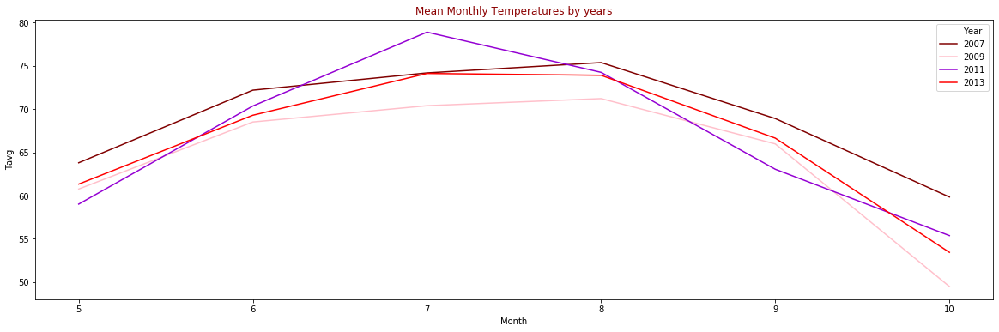

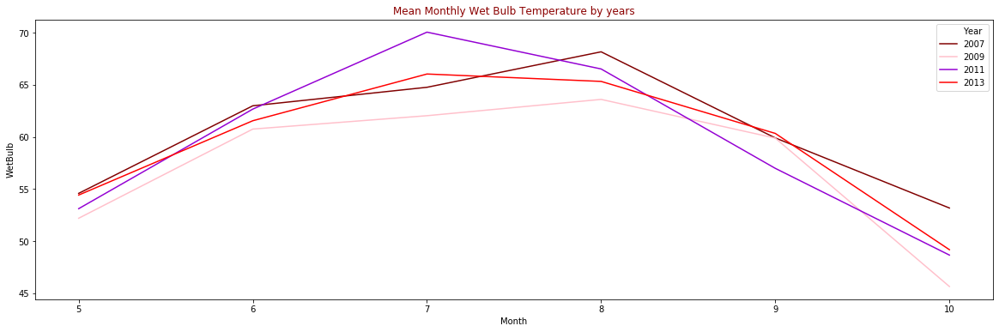

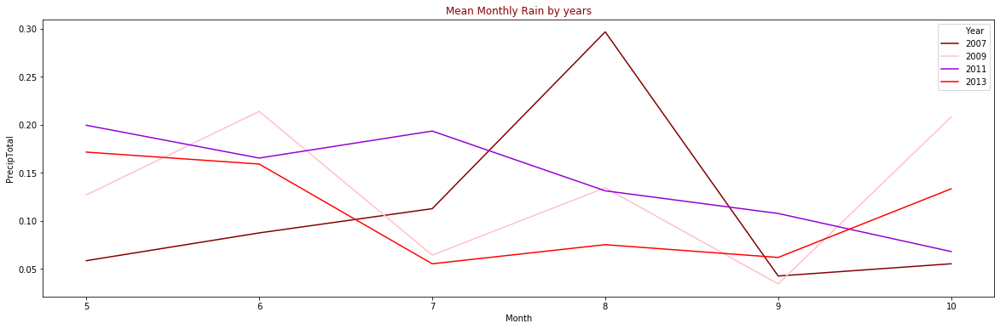

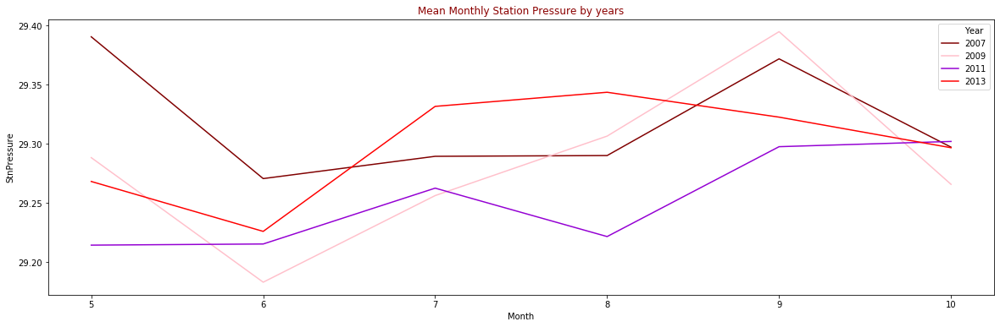

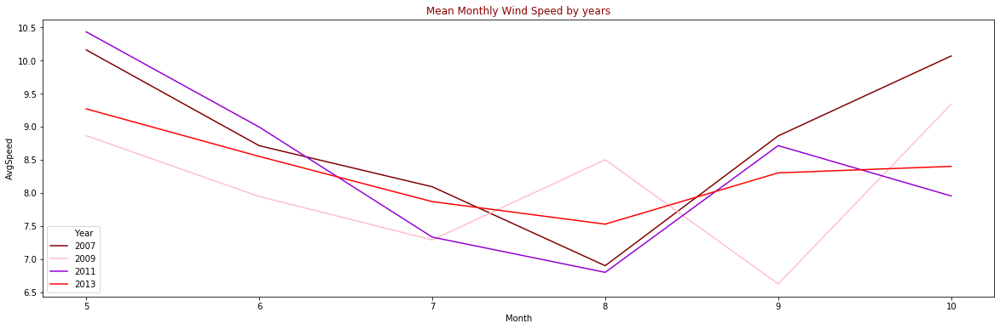

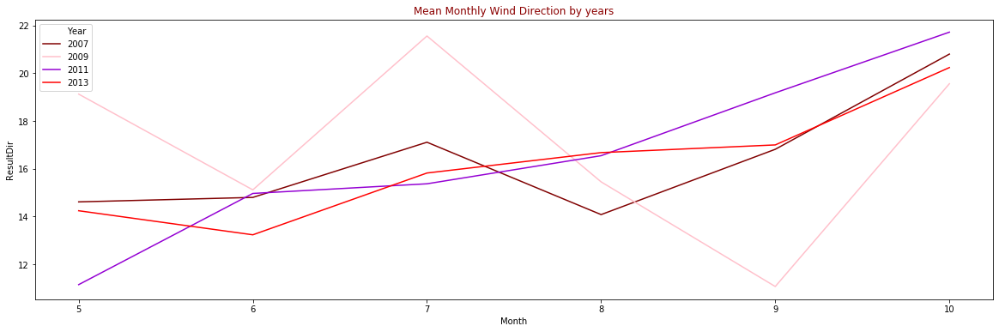

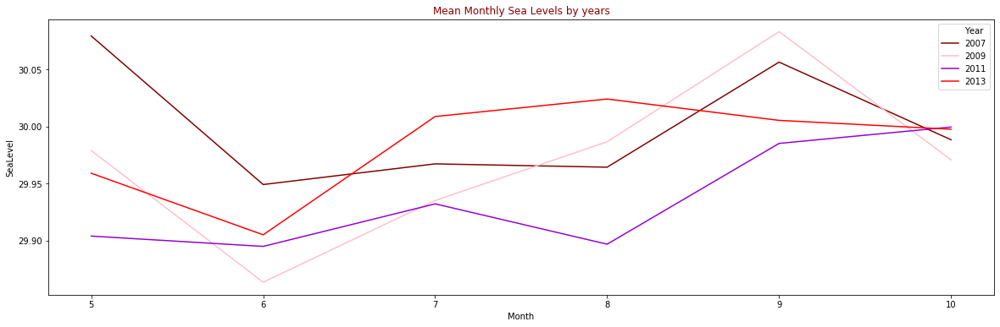

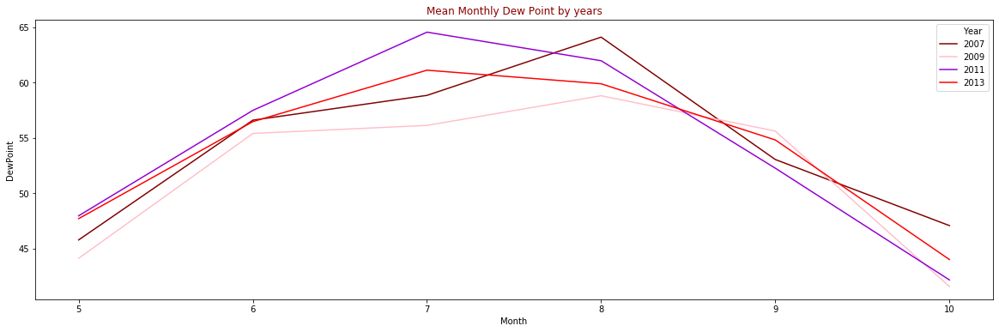

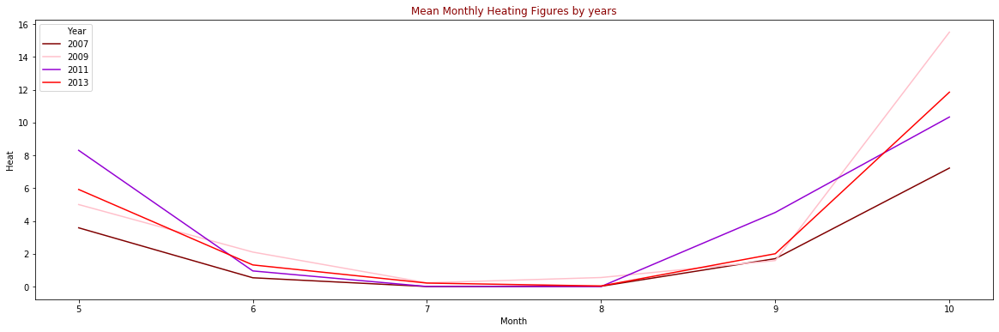

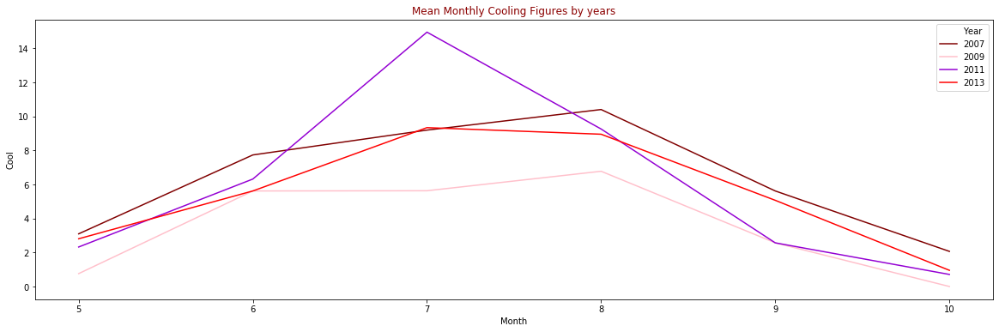

In [15]:
# Creating a function to plot weather trends over the years
def plot_weather_years(weather_tuples):
    plt.figure(figsize=(20,6));
    sns.lineplot(x = "Month",y = weather_tuples[0], data = weather_eda_years, hue = 'Year', ci = None, 
                 legend = 'full', palette = color_dict);
    plt.title(label="Mean Monthly "+ weather_tuples[1] +" by years", fontsize=12, c="darkred");

# Creating a list for the function to iterate through
weather_list = [("Tavg","Temperatures"), ("WetBulb", "Wet Bulb Temperature"),
                    ("PrecipTotal", "Rain"), ("StnPressure", "Station Pressure"),
                    ("AvgSpeed", "Wind Speed"), ("ResultDir", "Wind Direction"),
                ("SeaLevel", "Sea Levels"), ("DewPoint", "Dew Point"),
                ("Heat", "Heating Figures"), ("Cool", "Cooling Figures")]    

# Calling the function on our list
[plot_weather_years(tuple) for tuple in weather_list];

# Comment: for lineplots where the different lines represent something ordinal, or with some sequence, consider using colour gradient

# Comment: should also comment abit on the plots above, any interesting observations. Remember, all plots should have some interpretation ("what is the point of this plot?")

In [16]:
# Creating a dataframe to plot observations by month for weather
spray_eda_years = spray_cleaned.copy()
spray_eda_years["Year"] = [entry.year for entry in spray_eda_years["Date"]]
spray_eda_years["Month"] = [entry.month for entry in spray_eda_years["Date"]]


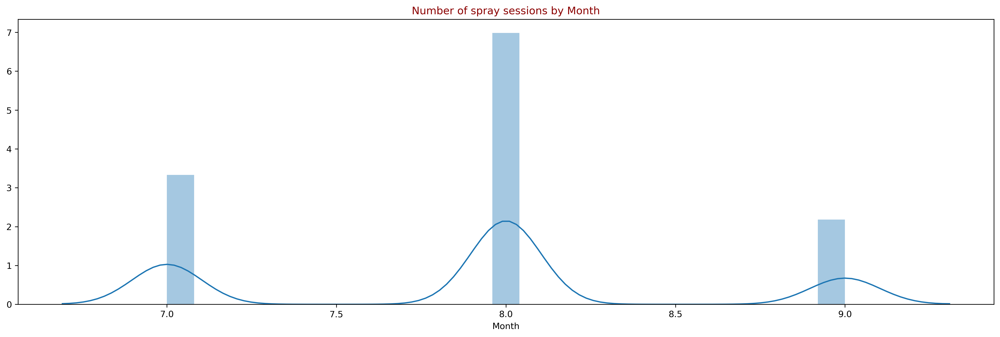

In [17]:
# Checking the distribution of the spray sessions over three months
plt.figure(figsize=(20,6), dpi=300);
sns.distplot(spray_eda_years["Month"]);
plt.title('Number of spray sessions by Month', fontsize=12, c="darkred");
# We can see that the intensity of the spray sessions are increase in the month of August

In [18]:
spray_eda_years.groupby(["Year","Month"]).count()

Date  Time  Latitude  Longitude
Year Month                                 
2011 8        95    95        95         95
     9      1573  1573      1573       1573
2013 7      3809  3809      3809       3809
     8      7893  7893      7893       7893
     9       924   924       924        924

In [19]:
train_eda_years.groupby(["Year","Month"])["WnvPresent"].mean()

Year  Month
2007  5        0.000000
      6        0.000000
      7        0.010435
      8        0.097561
      9        0.036176
      10       0.009479
2009  5        0.000000
      6        0.000000
      7        0.006623
      8        0.024064
      9        0.011962
      10       0.000000
2011  6        0.000000
      7        0.017188
      8        0.048682
      9        0.040741
2013  6        0.002294
      7        0.037736
      8        0.172662
      9        0.144033
Name: WnvPresent, dtype: float64

**WNV Thrived....**

> **...in 2013** - Although there were way more checks done in 2007, The checks in 2013 yielded more WNV-positive instances. 

> **...in August Weather** - The high temperatures and humidity(measured by dew point) in August seems to creative good conditions for WNV to thrive. 

> **...despite heavy pesticide use** - During August 2013, the city had twice as many "spray" sessions(7893) than the month before. Despite that, about 17 percent of all checks that month yielded WNV cases. This is more than three times higher than five percent, the mean number of WNV-positive checks)

---

## 2.2 Geospatial Exploration
We'll now check out possible clusters in our data

In [20]:
# Creating DataFrames for the geo plot
spray1 = spray_cleaned.copy()


In [21]:
# Reading in the Combined dataset
# Note that this dataset was creating during our modelling phase
combined =pd.read_csv('data/combined.csv',parse_dates=['Date'])

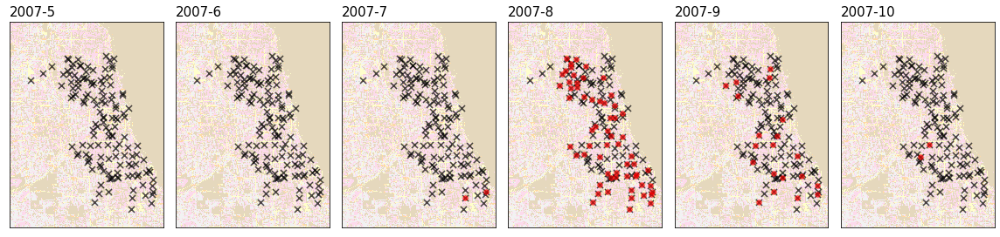

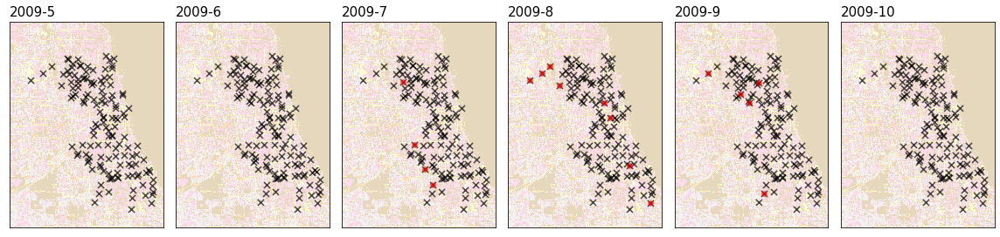

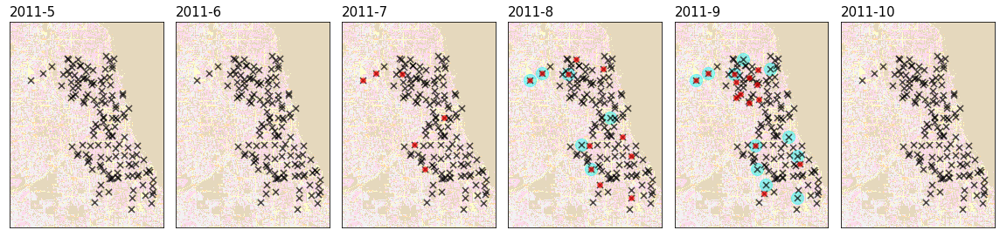

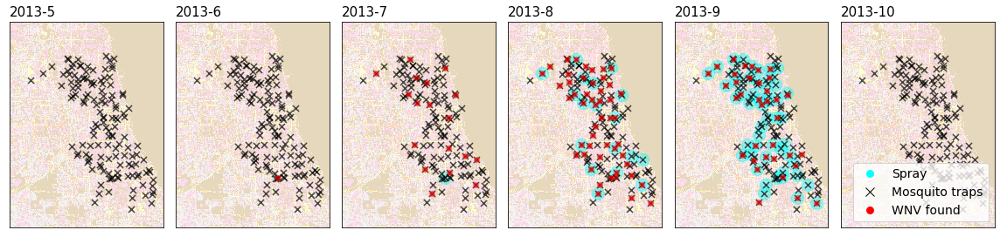

In [22]:
# Visualising Geospatial data over the years and months. 
# We're adapting elaine zhao's(DSI10) code for this segment. 
# Will try to make it our own as much as possible

# plot spray data
spray1['year'] = spray1.Date.apply(lambda x:x.year)
spray1['month'] = spray1.Date.apply(lambda x:x.month)
combined['Year'] = combined.Date.apply(lambda x:x.year)
combined['Month'] = combined.Date.apply(lambda x:x.month)


#set up basemap
mapdata = np.loadtxt("./data/mapdata_copyright_openstreetmap_contributors.txt")
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

# create plot for each month and year 
for year in combined.Year.unique():
    fig, ax = plt.subplots(ncols = 6, figsize = (16,5))
    
    for i, month in enumerate([5,6,7,8,9,10]):
        # plot basemap
        ax[i].imshow(mapdata, cmap=plt.get_cmap('Pastel1'), extent=lon_lat_box, aspect=aspect)
        
        # plot spray locations for year and month
        if year in spray1.year.unique() and month in spray1.month.unique():
            sprayed = spray1[(spray1.year == year) & (spray1.month == month)][['Longitude', 'Latitude']].drop_duplicates().values
            ax[i].scatter(wnv[:,0], wnv[:,1], marker='o', c = 'cyan', s = 200, alpha = 0.4)
        
        # plot trap locations
        locations = combined[['Longitude', 'Latitude']].drop_duplicates().values
        ax[i].scatter(locations[:,0], locations[:,1], marker='x', c = 'black', s=50, alpha = 0.7)
        
        # plot wnv locations for year and month
        wnv = combined[(combined.Year == year) & (combined.Month == month) & (combined.WnvPresent == 1)]\
                [['Longitude', 'Latitude']].drop_duplicates().values
        ax[i].scatter(wnv[:,0], wnv[:,1], marker='o', c = 'red', s = 30, alpha=0.6)
        
        # title and axes
        ax[i].set_title(f"{year}-{month}", fontsize = 15, ha = 'left', position = (0,1))
        ax[i].set_xticks([])
        ax[i].set_yticks([])
        
        plt.tight_layout()
#         plt.savefig(f'heatmap_{year}_{month}')

# custom legend
legend_elements=[Line2D([0],[0],marker='o', color='w',label='Spray', markerfacecolor='cyan', markersize=10),
                 Line2D([0],[0],marker='x', color='black', label='Mosquito traps',linestyle='', markersize=10),
                 Line2D([0],[0],marker='o', color='w',label='WNV found',markerfacecolor='red', markersize=10)]

plt.legend(handles=legend_elements, loc='lower right', fontsize=14)
plt.tight_layout()

**Inferences from Geospatial plots** - 
> **No John Snow-esque "water pump"** - Unlike English physician's 1854 findings that the cholera stemmed from one main water pump, there doesn't seem to be a clear "WNV-hotbed" cluster.

> **"Carpet Bombing" in August 2013** - There was a clear mass-spraying reaction from the authorities during this particular month. It seems to be a reaction to massive WNV-positive checks the month before. It might be worthwhile to look at this particular month to check the effectiveness of spray operations.

# Comment: nice plots and interpretation

---

## 2.3 Worst-hit neighbourhoods/periods


In [23]:
# Creating a dataframe showing total number of WNV-positive cases found
streets_wnv_found = pd.DataFrame(train[["Street", "WnvPresent"]].groupby("Street").sum().sort_values("WnvPresent", ascending=False))
streets_wnv_found.columns=['total_wnv_cases']
streets_wnv_found

,total_wnv_cases
Street,
W OHARE AIRPORT,66
S DOTY AVE,41
N OAK PARK AVE,24
S STONY ISLAND AVE,17
N MILWAUKEE AVE,14
...,...
S LONGWOOD DR,0
W AGATITE AVE,0
W BALMORAL AVE,0


In [24]:
# Creating a dataframe showing total number of checks done.
streets_checks=pd.DataFrame(train[["Street", "WnvPresent"]].groupby("Street").count().sort_values("WnvPresent", ascending=False))
streets_checks.columns=["total_checks_done"]
streets_checks

,total_checks_done
Street,
W OHARE AIRPORT,750
S DOTY AVE,542
S STONY ISLAND AVE,347
S ASHLAND AVE,266
N OAK PARK AVE,216
...,...
S RACINE AVE,8
W 77TH ST,7
S LONGWOOD DR,5


In [25]:
# Joining both Dataframes
streets_eda =streets_checks.join(streets_wnv_found)
streets_eda.sort_values("total_checks_done", ascending=False, inplace=True)
streets_eda

,total_checks_done,total_wnv_cases
Street,,
W OHARE AIRPORT,750,66
S DOTY AVE,542,41
S STONY ISLAND AVE,347,17
S ASHLAND AVE,266,9
N OAK PARK AVE,216,24
...,...,...
S RACINE AVE,8,0
W 77TH ST,7,0
S LONGWOOD DR,5,0


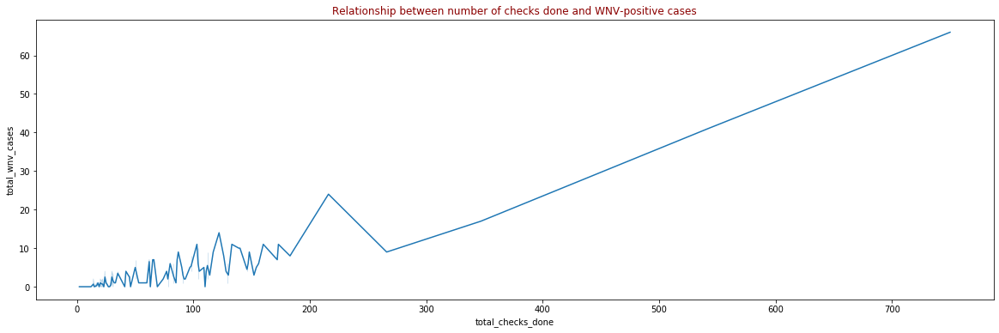

In [26]:
# Relationship between number of checks done and WNV-positive cases
plt.figure(figsize=(20,6));
sns.lineplot("total_checks_done", "total_wnv_cases", data=streets_eda, palette = "magma");
plt.title('Relationship between number of checks done and WNV-positive cases', fontsize=12, c="darkred");

#As we can see, the more checks we do, we are going to find more WNV cases
# These doesn't really tell us what the worst-hit streets are.
# A more effective chart would be to look at average cases found

In [27]:
# Seeking out neighbourhoods which has tested WNV-positive more on average.
mean_streets = pd.DataFrame(train[["Street", "WnvPresent"]].groupby("Street").mean().sort_values("WnvPresent", ascending=False))
mean_streets.columns = ["WNV_percentage"]
mean_streets["WNV_percentage"] = mean_streets["WNV_percentage"]*100
mean_streets 

top_20_mean = mean_streets.head(20)
top_20_mean


,WNV_percentage
Street,
N AVONDALE AVE,16.666667
W ROSCOE ST,14.285714
N HARLEM AVE,14.000000
W STRONG ST,13.333333
W 89TH ST,12.000000
N MILWAUKEE AVE,11.475410
W FOSTER AVE,11.428571
W 65TH ST,11.290323
N OAK PARK AVE,11.111111


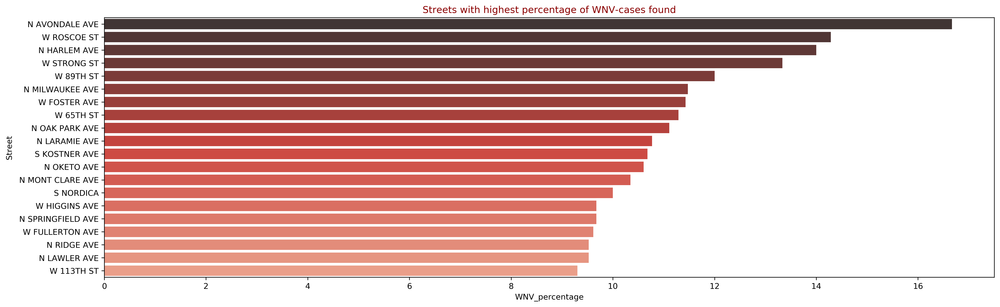

In [28]:
# Creating a plot for the Worst-hit streets
# i.e. for every 100 checks that were done on these streets...
# ...North Avondale ave had 16.6 WNV-positive cases
fig = plt.figure(figsize=(20,6), dpi=300)
sns.barplot(top_20_mean["WNV_percentage"], top_20_mean.index, orient="h", palette="Reds_d");
plt.title('Streets with highest percentage of WNV-cases found', fontsize=12, c="darkred");
# A quick check on google maps show that to drive a route that touches the first four...
#...locations will only take 12miles

In [29]:
# Creating a "wnv_ratio" column to contain the percentage of wnv-positive cases on that given street. 
# Higher the number, the more "dangerous" that zone.

# Creating the column with a dummy float
train["% of WNV-positive checks"]= 1.0

# Creating a nested for loop to impute the percentages from mean streets into every street in our train set
for row in range(train.shape[0]):
    for street in range(mean_streets.shape[0]):
        if train["Street"][row]== mean_streets.index[street]:
            train["% of WNV-positive checks"][row]=mean_streets.iloc[street]

/Users/user/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


In [30]:
# Checking if column was created successfully
train["% of WNV-positive checks"].head(10)

0    11.111111
1    11.111111
2     0.000000
3    11.428571
4    11.428571
5     8.571429
6     0.000000
7     2.739726
8     2.739726
9     1.176471
Name: % of WNV-positive checks, dtype: float64

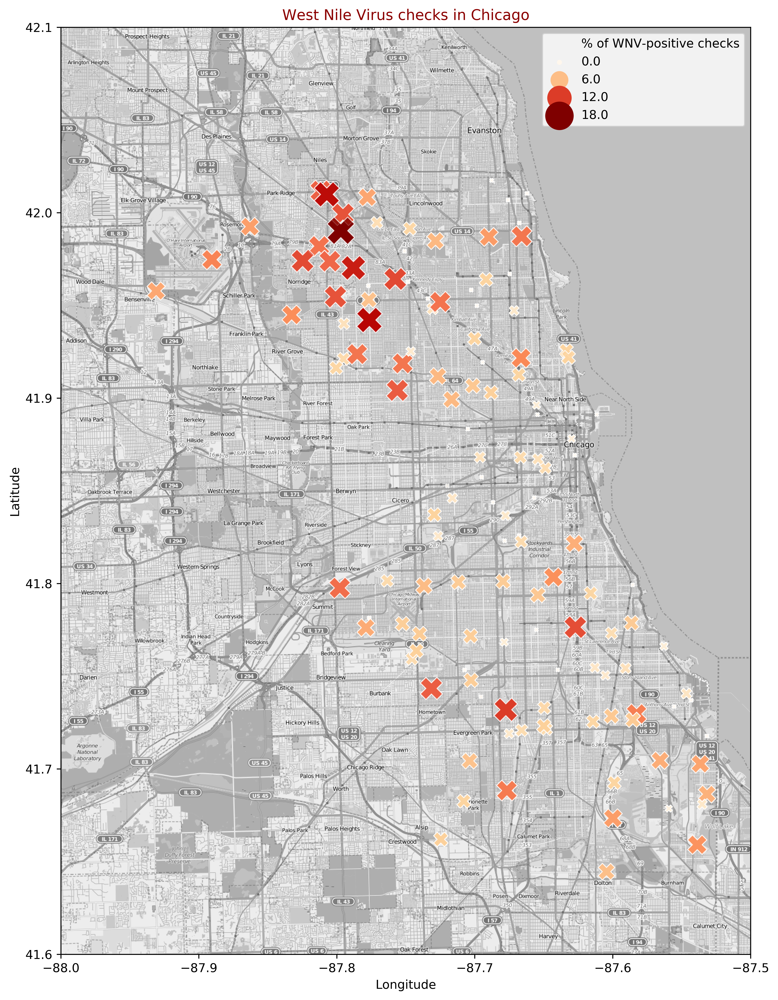

In [31]:
#Creating a geospatial plot with the data above...
#...with hues and markersize showing which are the worst-hit streets
mapdata = np.loadtxt("./data/mapdata_copyright_openstreetmap_contributors.txt")

aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

plt.figure(figsize=(20,14), dpi=500)
plt.imshow(mapdata,
          cmap=plt.get_cmap('gray'),
          extent=lon_lat_box,
          aspect=aspect)
plt.title('West Nile Virus checks in Chicago', fontsize=12, c="darkred");

sns.scatterplot(train['Longitude'], train['Latitude'], marker='X', 
                hue=train["% of WNV-positive checks"], size =train["% of WNV-positive checks"],
               sizes=(10, 500), palette="OrRd", alpha=0.5, legend="brief");

> **a WNV-cluster in Northern Chicago** - From this visualisation, we can see that there is higher percentage of WNV-positive checks in the northern part of our map (Lat>41.89, Lon<87.71)


---

## 2.4 Repeat "Offenders"
Are any of this clusters "repeat offenders". i.e. If there is a WNV case this year, there will be one the next year!

In [32]:
# Creating a list of all addresses with WNV-positive reports
train["Date_alt"] = train["Date"]
train_repeat = train.set_index("Date")

# Sorting the values according to Addresses then Date
train_repeat = train_repeat[["Address", "WnvPresent", "Date_alt"]][train_repeat["WnvPresent"]==1].sort_values(["Address","Date_alt"])
train_repeat

,Address,WnvPresent,Date_alt
Date,,,
2007-08-24,"1000 East 67th Street, Chicago, IL 60637, USA",1,2007-08-24
2007-09-12,"1000 East 67th Street, Chicago, IL 60637, USA",1,2007-09-12
2011-08-19,"1000 East 67th Street, Chicago, IL 60637, USA",1,2011-08-19
2013-07-12,"1000 East 67th Street, Chicago, IL 60637, USA",1,2013-07-12
2013-07-19,"1000 North Central Park Avenue, Chicago, IL 60...",1,2013-07-19
...,...,...,...
2013-09-19,"University of Illinois at Chicago, 1100 South ...",1,2013-09-19
2013-07-19,"West Garfield Boulevard, Chicago, IL, USA",1,2013-07-19
2013-08-08,"West Garfield Boulevard, Chicago, IL, USA",1,2013-08-08


In [33]:
# Creating a list of addresses that have tested positive for WNV on different years
repeat_offenders = []

# Looping through a list of all WNV-positive instances
for i in range(train_repeat.shape[0]):
    # We'll append the address to a list if a WNV-positive case was reported on a different year
    if i < train_repeat.shape[0]-1:
        if train_repeat["Address"][i]==train_repeat["Address"][i+1] and train_repeat.index[i].year != train_repeat.index[i+1].year:
            repeat_offenders.append(train_repeat["Address"][i])
    # an else condition accounting for the last address in our data frame
    else:
        if train_repeat["Address"][i]==train_repeat["Address"][i-1] and train_repeat.index[i].year != train_repeat.index[i-1].year:
            repeat_offenders.append(train_repeat["Address"][i])
# Creating a Dataframe with all repeat offenders
repeat_offenders_df = pd.DataFrame(repeat_offenders, columns=["addresses_with_WNV_on_diff_years"])
# Getting the numbers for number of repeat WNVs on different years
repeat_offenders_df["addresses_with_WNV_on_diff_years"].value_counts()

# Creating a Dataframe with the number of repeated "offences"
number_repeats = pd.DataFrame(repeat_offenders_df["addresses_with_WNV_on_diff_years"].value_counts())
number_repeats.columns=["Num_WNV_on_diff_year"]
number_repeats.head(10)

# Early inferences: We can see that some of these columns has had WNV cases across 4 different years!

,Num_WNV_on_diff_year
"University of Illinois at Chicago, 1100 South Ashland Avenue, Chicago, IL 60607, USA",3
"4100 North Oak Park Avenue, Chicago, IL 60634, USA",3
"3500 West 116th Street, Chicago, IL 60655, USA",3
"3300 West 104th Street, Chicago, IL 60655, USA",3
"4000 East 130th Street, Chicago, IL 60633, USA",2
"7000 West Armitage Avenue, Chicago, IL 60707, USA",2
"5800 North Western Avenue, Chicago, IL 60659, USA",2
"4600 Milwaukee Avenue, Chicago, IL 60630, USA",2
"6100 West Fullerton Avenue, Chicago, IL 60639, USA",2
"3600 North Pittsburgh Avenue, Chicago, IL 60634, USA",2


In [34]:
# Creating a "Num_WNV_on_diff_year" column to contain the percentage of wnv-positive cases on that given street. 
# Higher the number, the more "dangerous" that zone.

# Creating the column with a dummy float
train["Num_WNV_on_diff_year"]= 0

# Creating a nested for loop to impute the percentages from mean streets into every street in our train set
for row in range(train.shape[0]):
    for offender in range(number_repeats.shape[0]):
        if train["Address"][row]== number_repeats.index[offender]:
            train["Num_WNV_on_diff_year"][row]+=number_repeats["Num_WNV_on_diff_year"][offender]
# Checking on whether column was created
train["Num_WNV_on_diff_year"]

/Users/user/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


0        3
1        3
2        0
3        0
4        0
        ..
10501    0
10502    0
10503    0
10504    0
10505    0
Name: Num_WNV_on_diff_year, Length: 10506, dtype: int64

In [35]:
# Number of Sites and their Repeated "Offences"
train["Num_WNV_on_diff_year"].value_counts()
 

0    4392
2    2845
1    2696
3     573
Name: Num_WNV_on_diff_year, dtype: int64

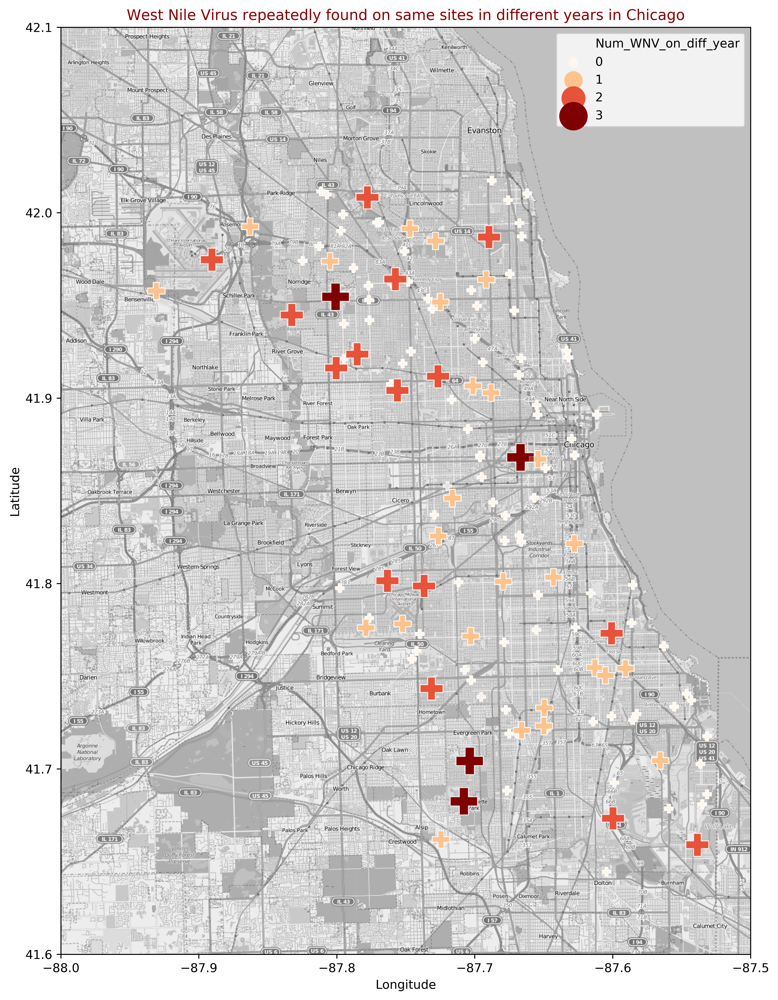

In [36]:
#Creating a geospatial plot with the data above...
#...with hues and markersize showing which are the worst-hit streets
mapdata = np.loadtxt("./data/mapdata_copyright_openstreetmap_contributors.txt")

aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

plt.figure(figsize=(20,14), dpi=500)
plt.imshow(mapdata,
          cmap=plt.get_cmap('gray'),
          extent=lon_lat_box,
          aspect=aspect)
plt.title('West Nile Virus repeatedly found on same sites in different years in Chicago', fontsize=12, c="darkred");

sns.scatterplot(train['Longitude'], train['Latitude'], marker='P', 
                hue=train["Num_WNV_on_diff_year"], size =train["Num_WNV_on_diff_year"],
               sizes=(50, 500), palette="OrRd", alpha=0.5, legend="brief");

---

## 2.5 Investigating 41 North Oak Park: Chicago's WNV hotspot

In this part of the EDA process, we will be engineering a WNV Score to find out which is the most "dangerous" address in Chicago. We will then look at some of the reasons that make this location dangerous. 


In [37]:
# Engineering a WNV Score to find out which is the most "dangerous" Address
# We will multiply the % of WNV-positive checks by the number...
# ... of times the place has been a "repeat offender"

train["WNV_Score"] = train["% of WNV-positive checks"]*train["Num_WNV_on_diff_year"]
train["WNV_Score"].describe()

count    10506.000000
mean         6.428852
std          7.711338
min          0.000000
25%          0.000000
50%          3.809524
75%         12.244898
max         33.333333
Name: WNV_Score, dtype: float64

In [38]:
# Checking out the Addresses with the highest (worst) score
train[["Address"]][train["WNV_Score"]==train["WNV_Score"].max()].nunique()

# Gasp! There is only 1 address at the top

Address    1
dtype: int64

In [39]:
n_oak_park = train[train["WNV_Score"]==train["WNV_Score"].max()]
n_oak_park.head()

,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent,Year,Month,% of WNV-positive checks,Date_alt,Num_WNV_on_diff_year,WNV_Score
0,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9,1,0,2007,5,11.111111,2007-05-29,3,33.333333
1,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9,1,0,2007,5,11.111111,2007-05-29,3,33.333333
25,2007-06-05,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9,3,0,2007,6,11.111111,2007-06-05,3,33.333333
26,2007-06-05,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9,5,0,2007,6,11.111111,2007-06-05,3,33.333333
27,2007-06-05,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9,1,0,2007,6,11.111111,2007-06-05,3,33.333333


In [40]:
n_oak_park.describe()

,Block,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent,Year,Month,% of WNV-positive checks,Num_WNV_on_diff_year,WNV_Score
count,185.0,1.850000e+02,1.850000e+02,185.0,185.000000,185.000000,185.000000,185.000000,1.850000e+02,185.0,1.850000e+02
mean,41.0,4.195469e+01,-8.780099e+01,9.0,20.054054,0.097297,2010.091892,7.405405,1.111111e+01,3.0,3.333333e+01
std,0.0,1.923672e-13,5.699768e-14,0.0,17.740500,0.297166,2.395010,1.089961,2.137413e-14,0.0,5.699768e-14
min,41.0,4.195469e+01,-8.780099e+01,9.0,1.000000,0.000000,2007.000000,5.000000,1.111111e+01,3.0,3.333333e+01
25%,41.0,4.195469e+01,-8.780099e+01,9.0,4.000000,0.000000,2007.000000,7.000000,1.111111e+01,3.0,3.333333e+01
50%,41.0,4.195469e+01,-8.780099e+01,9.0,14.000000,0.000000,2009.000000,7.000000,1.111111e+01,3.0,3.333333e+01
75%,41.0,4.195469e+01,-8.780099e+01,9.0,34.000000,0.000000,2013.000000,8.000000,1.111111e+01,3.0,3.333333e+01
max,41.0,4.195469e+01,-8.780099e+01,9.0,50.000000,1.000000,2013.000000,10.000000,1.111111e+01,3.0,3.333333e+01


In [41]:
n_oak_park.Year.value_counts()

2013    60
2007    49
2009    46
2011    30
Name: Year, dtype: int64

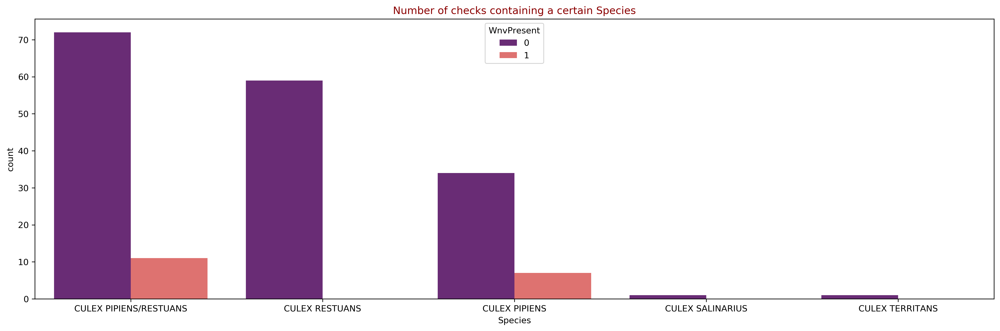

In [42]:
#Creating an alternate plot to look at the WNV occurances by Species
plt.figure(figsize=(20,6), dpi=300);
sns.countplot("Species", data=n_oak_park, hue="WnvPresent", palette="magma");
plt.title('Number of checks containing a certain Species', fontsize=12, c="darkred");

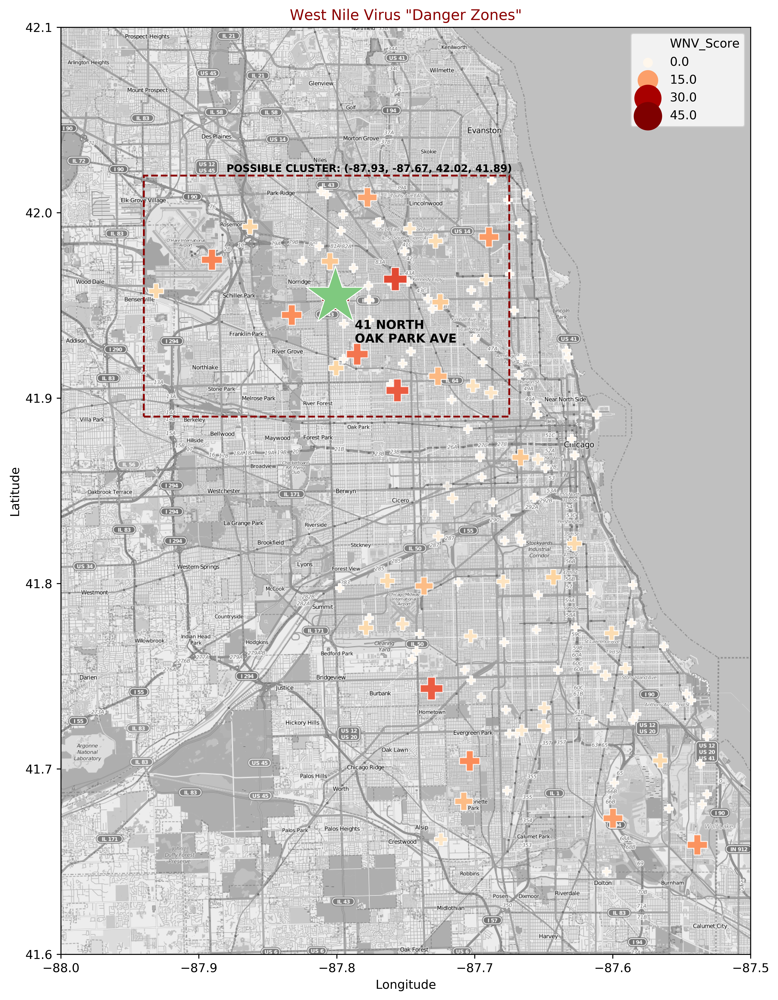

In [43]:
#Creating a geospatial plot with the data above...
#...with hues and markersize showing which are the worst-hit streets
mapdata = np.loadtxt("./data/mapdata_copyright_openstreetmap_contributors.txt")

aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

plt.figure(figsize=(20,14), dpi=500)
plt.imshow(mapdata,
          cmap=plt.get_cmap('gray'),
          extent=lon_lat_box,
          aspect=aspect)
plt.title('West Nile Virus "Danger Zones"', fontsize=12, c="darkred");



# Creating a Scatterplot of spots according to the WNV Scores
p2 = sns.scatterplot(train['Longitude'], train['Latitude'], marker='P', 
                hue=train["WNV_Score"], size =train["WNV_Score"],
               sizes=(50, 500), palette="OrRd", alpha=0.5, legend="brief");


# Add a bounding box to the Axes
rect = patches.Rectangle((-87.94,41.89),0.265,0.13,linewidth=1.5,edgecolor='darkred',facecolor='none', linestyle="--")
p2.add_patch(rect)

# Add text annotation for bounding box
p2.text(-87.88, 42.022, "POSSIBLE CLUSTER: (-87.93, -87.67, 42.02, 41.89)", horizontalalignment='left', size='small', color='k', weight='semibold');
#sns.plt.show()

# Creating a Star for 41 North Oak Park Ave
p1 = sns.scatterplot(n_oak_park['Longitude'], n_oak_park['Latitude'], marker='*', 
                hue=n_oak_park["Address"],
               s=2500, palette="Accent", alpha=1, legend=None);

# Add text annotation for 41 North Oak
p1.text(-87.787, 41.93, "41 NORTH\nOAK PARK AVE", horizontalalignment='left', size='medium', color='black', weight='semibold');
#sns.plt.show()


**Quick Facts about 41 North Oak Park:**

- Based on our engineered WNV Score, 41 North Oak Park is the Chicago's most dangerous spot when it comes to the West Nile Virus

- WNV has been found at this location on checks over 4 different years (2007, 2009, 2011, 2013).

- Out of 185 checks done on this location, 11% were WNV-positive.

- The culprits on this particular location werre Culex Pipiens/Restuans and Culex Pipiens.

- The address also sits in the centre of a cluster with other addresses of high WNV Scores of more than 15.

---

## 2.5 Were the Spraying Sessions of September 2013 effective?

We only have 4 months of spray records in our available dataset. Of the four months, the September of 2013 has the most comprehensive spray data. (Either that or the authorities ordered a really comprehensive carpet bombing of the spot. Looking at the data from this month alone will help give us some insight to the effectiveness of the government's spray strategy.

In [44]:
#Setting the date as the index column
spray_date = spray_cleaned.set_index("Date")
train_date = train.set_index("Date")

In [45]:
# Choosing to only focus on the year 2013
train_date = train_date[train_date.index.year == 2013]
spray_date = spray_date[spray_date.index.year == 2013]

In [46]:

lyon = (45.7597, 4.8422) # (lat, lon)
paris = (48.8567, 2.3508)

haversine(lyon, paris)


392.2172595594006

In [47]:
train_date['geometry'] = train_date.apply(lambda x: tuple([x.Longitude, x.Latitude]), axis=1).copy()

In [48]:
spray_date['geometry'] = spray_date.apply(lambda x: tuple([x.Longitude, x.Latitude]), axis=1).copy()

In [49]:
# Creating a column to indicate if an area was sprayed...
# ...and how many times it was sprayed...
train_date['got_spray']=0
for row_num in range(train_date.shape[0]):
    # We only have spray records from 2013-07-17 to 2013-09-05...
    # So we'll only loop through those dates to make this nested loop cheaper.
    if train_date.index[row_num]>spray_date.index[0] and train_date.index[row_num]<spray_date.index[12625]:
        for spray_num in range(spray_date.shape[0]):
            # Condition 1: Dates must be the same
            # Condition 2: Coordinates must be less than 50metres apart
            # We'll calculate distance using the haversine function
            if train_date.index[row_num] == spray_date.index[spray_num] and haversine(train_date['geometry'][row_num],spray_date['geometry'][spray_num])<0.05:
                train_date['got_spray'][row_num]+=1
                print(f"{train_date.Street[row_num]} was sprayed on {spray_date.index[spray_num].date()} @ {spray_date.Time[spray_num]}")


/Users/user/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]


 N SPRINGFIELD AVE was sprayed on 2013-07-25 @ 9:22:46 PM
 N SPRINGFIELD AVE was sprayed on 2013-07-25 @ 9:22:56 PM
 N SPRINGFIELD AVE was sprayed on 2013-07-25 @ 9:23:06 PM
 N SPRINGFIELD AVE was sprayed on 2013-07-25 @ 9:23:16 PM
 N SPRINGFIELD AVE was sprayed on 2013-07-25 @ 9:23:26 PM
 N SPRINGFIELD AVE was sprayed on 2013-07-25 @ 9:25:06 PM
 N SPRINGFIELD AVE was sprayed on 2013-07-25 @ 9:25:16 PM
 N SPRINGFIELD AVE was sprayed on 2013-07-25 @ 9:25:26 PM
 N SPRINGFIELD AVE was sprayed on 2013-07-25 @ 9:59:46 PM
 N SPRINGFIELD AVE was sprayed on 2013-07-25 @ 10:02:56 PM
 N SPRINGFIELD AVE was sprayed on 2013-07-25 @ 10:12:46 PM
 N SPRINGFIELD AVE was sprayed on 2013-07-25 @ 10:14:06 PM
 N SPRINGFIELD AVE was sprayed on 2013-07-25 @ 10:14:16 PM
 N SPRINGFIELD AVE was sprayed on 2013-07-25 @ 10:14:26 PM
 N SPRINGFIELD AVE was sprayed on 2013-07-25 @ 10:14:36 PM
 N SPRINGFIELD AVE was sprayed on 2013-07-25 @ 10:14:46 PM
 N SPRINGFIELD AVE was sprayed on 2013-07-25 @ 10:15:36 PM
 N SPR

  W ARMITAGE AVENUE was sprayed on 2013-08-15 @ 11:48:20 PM
  W ARMITAGE AVENUE was sprayed on 2013-08-15 @ 11:45:21 PM
  W ARMITAGE AVENUE was sprayed on 2013-08-15 @ 11:47:51 PM
  W ARMITAGE AVENUE was sprayed on 2013-08-15 @ 9:17:05 PM
  W ARMITAGE AVENUE was sprayed on 2013-08-15 @ 9:17:15 PM
  W ARMITAGE AVENUE was sprayed on 2013-08-15 @ 9:17:25 PM
  W ARMITAGE AVENUE was sprayed on 2013-08-15 @ 9:33:45 PM
  W ARMITAGE AVENUE was sprayed on 2013-08-15 @ 9:33:55 PM
  W ARMITAGE AVENUE was sprayed on 2013-08-15 @ 9:34:05 PM
  W ARMITAGE AVENUE was sprayed on 2013-08-15 @ 9:34:15 PM
  W ARMITAGE AVENUE was sprayed on 2013-08-15 @ 9:34:25 PM
  W ARMITAGE AVENUE was sprayed on 2013-08-15 @ 9:34:35 PM
  W ARMITAGE AVENUE was sprayed on 2013-08-15 @ 9:34:45 PM
  W ARMITAGE AVENUE was sprayed on 2013-08-15 @ 9:34:55 PM
  W ARMITAGE AVENUE was sprayed on 2013-08-15 @ 11:48:20 PM
 W FULLERTON AVE was sprayed on 2013-08-15 @ 10:50:35 PM
 W FULLERTON AVE was sprayed on 2013-08-15 @ 11:51:40 

In [50]:
train_date['got_spray'].value_counts()

0     2369
1        4
2        4
19       3
7        3
6        3
3        2
14       2
33       1
48       1
Name: got_spray, dtype: int64

In [51]:
# Creating a...
list_of_sprayed_addresses = train_date["AddressNumberAndStreet"][train_date.got_spray > 0].unique().tolist()
print(f"Number of Addresses that have been sprayed: {len(list_of_sprayed_addresses)}")
list_of_sprayed_addresses

Number of Addresses that have been sprayed: 12


['3900  N SPRINGFIELD AVE, Chicago, IL',
 '2800  N FRANCISCO AVE, Chicago, IL',
 '4100  N OAK PARK AVE, Chicago, IL',
 '7000   W ARMITAGE AVENUE, Chicago, IL',
 '6100  W FULLERTON AVE, Chicago, IL',
 '6000  W MONTROSE DR, Chicago, IL',
 '1300  N LARAMIE AVE, Chicago, IL',
 '1000  N CENTRAL PARK DR, Chicago, IL',
 '7700  S EBERHART AVE, Chicago, IL',
 '6500  E 91ST PL, Chicago, IL',
 '5800  N WESTERN AVE, Chicago, IL',
 '5800  N RIDGE AVE, Chicago, IL']

In [52]:
# Creating a narrowed dataset
spray_analysis = train_date[["AddressNumberAndStreet","NumMosquitos", "WnvPresent", "got_spray"]][train_date["AddressNumberAndStreet"].isin(list_of_sprayed_addresses)]

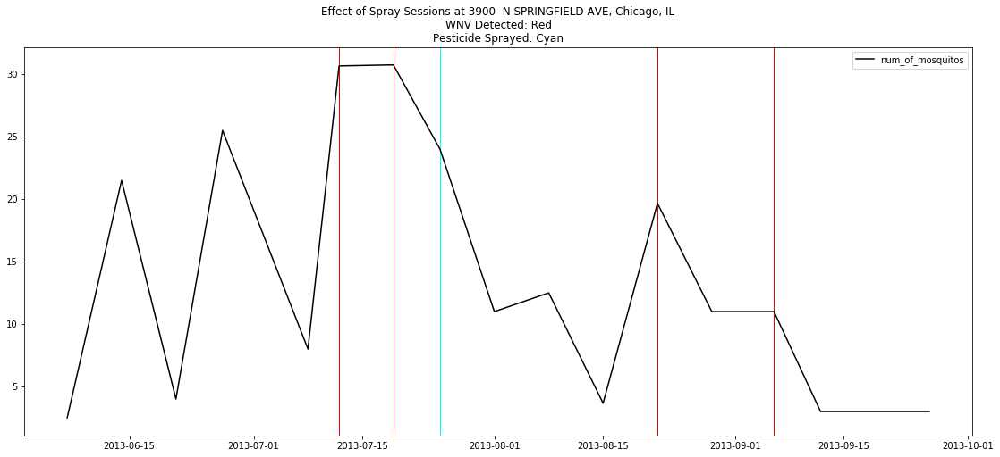

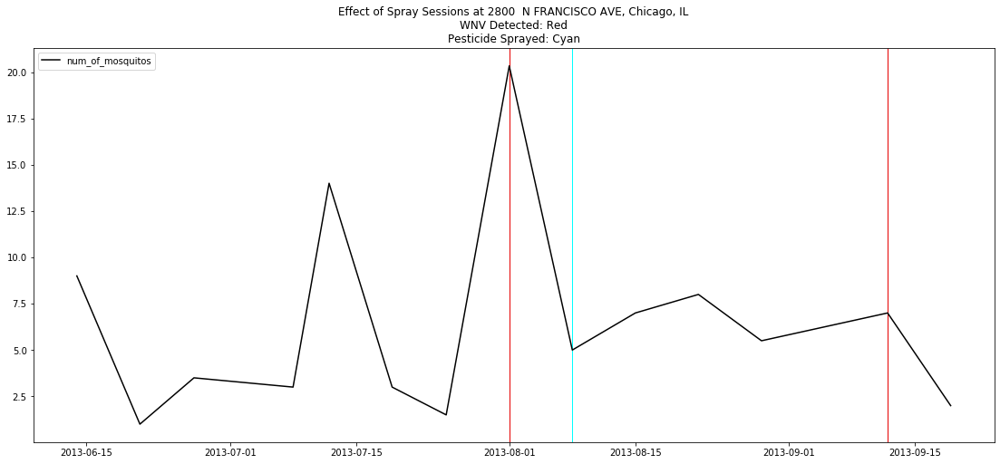

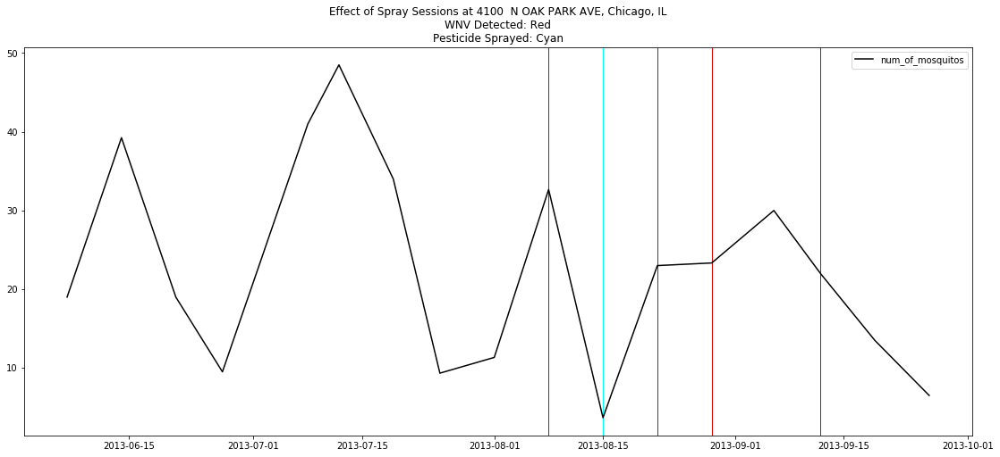

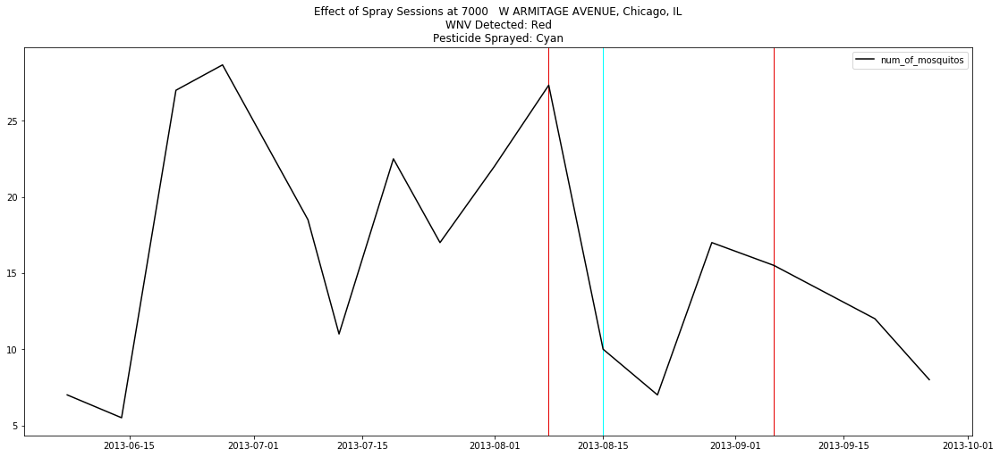

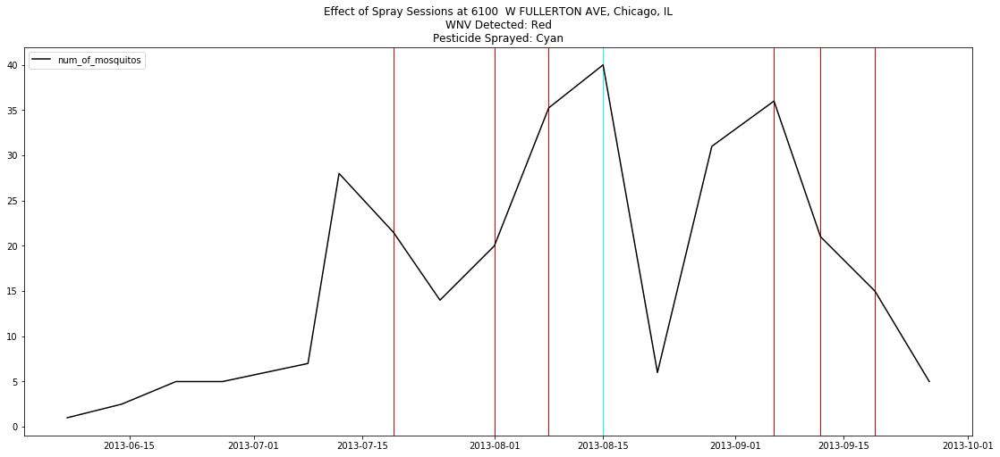

...

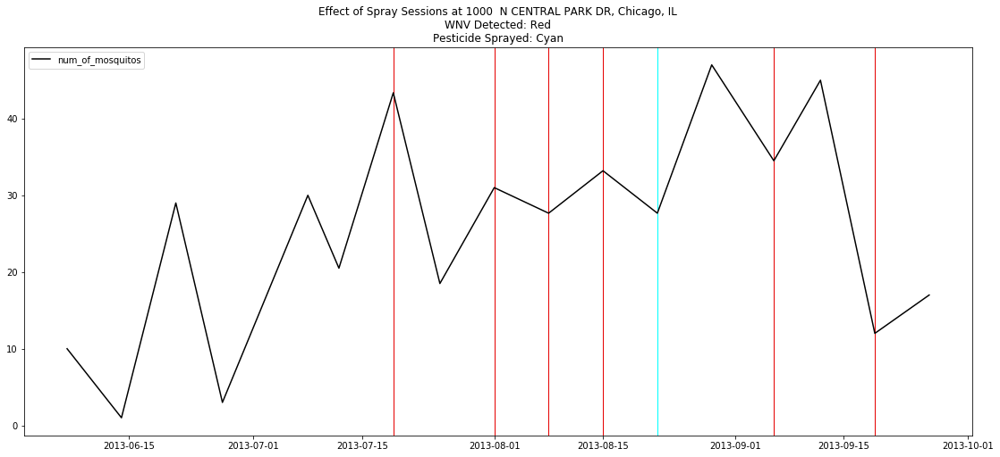

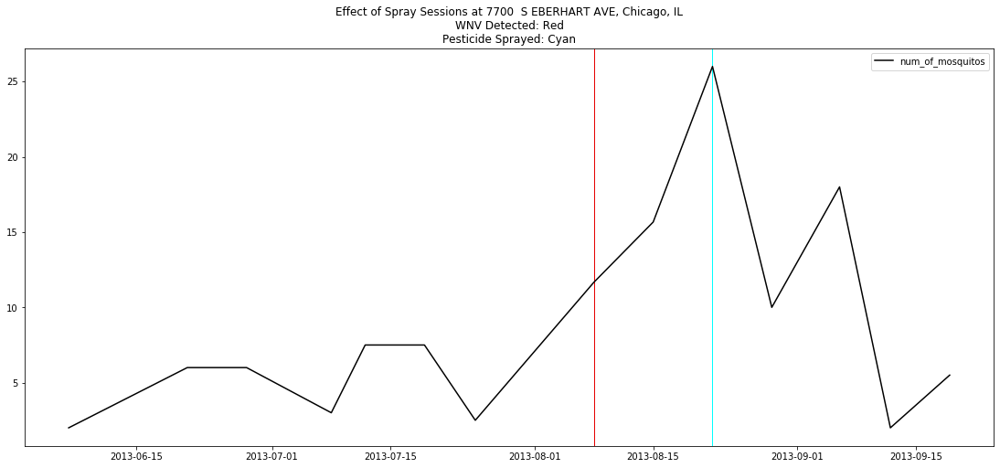

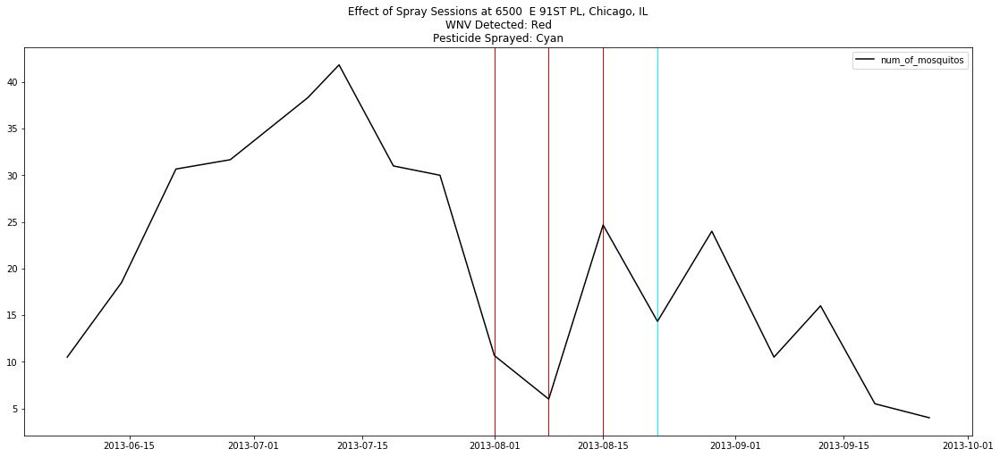

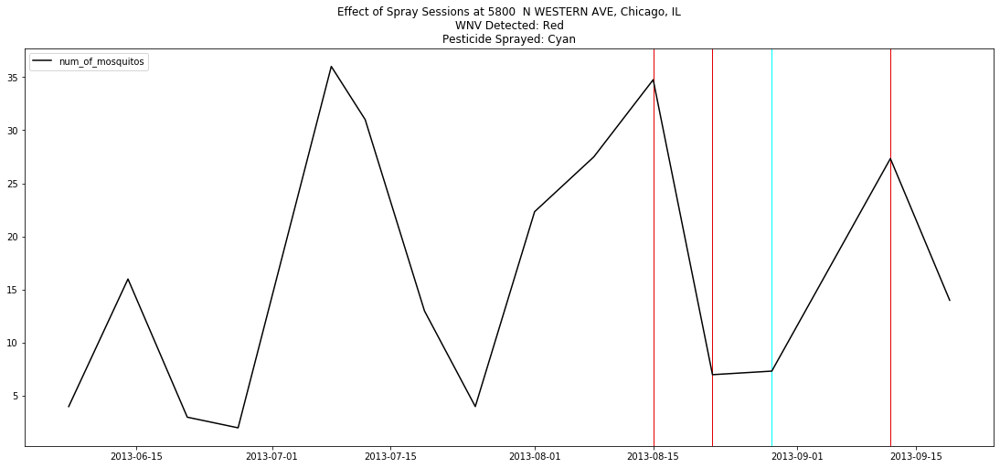

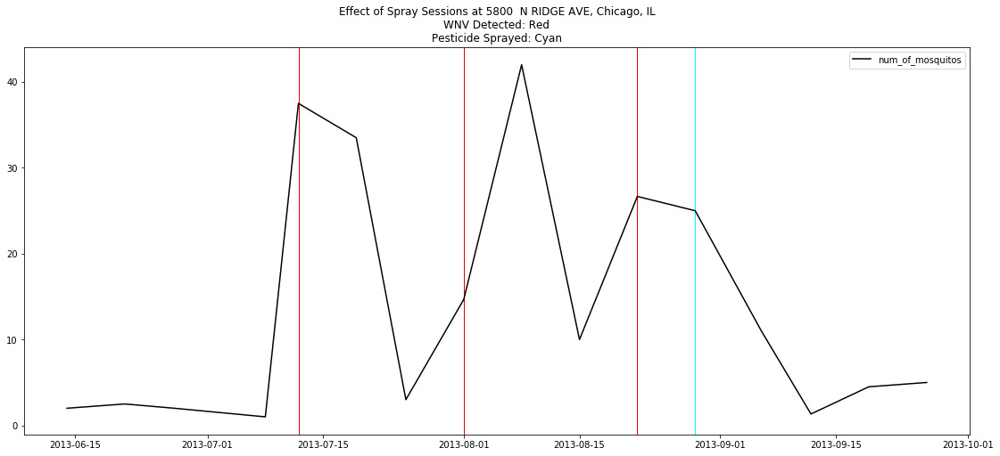

In [53]:
# Creating multiple plots to visualise the effect of spray sessions on certain addresses
for i in range(12):
    df = spray_analysis[spray_analysis.AddressNumberAndStreet.str.contains(list_of_sprayed_addresses[i])]
    df = df.groupby(df.index).mean()
    fig, ax = plt.subplots(1,figsize=(19, 8))
    ax.set_title(f'Effect of Spray Sessions at {list_of_sprayed_addresses[i]}\nWNV Detected: Red\nPesticide Sprayed: Cyan', 
                 fontsize=12)
    
    #adding a line plot for mosquitos
    ax.plot(df.NumMosquitos, color='black',label='num_of_mosquitos')
    
    trans = transforms.blended_transform_factory(
    ax.transData, ax.transAxes)

    #adding a patch for every instance of WNV presence
    for i in range(df.shape[0]):
            
        if df.WnvPresent[i] > 0: 
            ax.axvspan(df.index[i],df.index[i], color=sns.xkcd_rgb['red'], alpha=1,label = "_"*i + "interval")
            
    #adding a patch for every instance of Pesticide     
    for i in range(df.shape[0]):
            
        if df.got_spray[i] > 0: 
            ax.axvspan(df.index[i],df.index[i], color=sns.xkcd_rgb['cyan'], alpha=1,label = "_"*i + "interval")        

            
    
    ax.legend(loc='best');

**Evaluating the effectiveness of pesticide use**

> Not all instances of pesticide use resulted in a fall in the number of mosquitos.

> All instances of pesticide use resulted in eradicating West Nile Virus presence, with the exception of one particularly pesticide-resistant location....41 North Oak Park Ave.